**Import needed libraries**

In [176]:
import pandas as pd
import seaborn as sns
import plotly_express as px

import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings('ignore')

## 1 - Getting started

This project will be centered around the Chicago Crime & selected Census data. Start of by downloading both datasets.

**1.1** Read through the documentation for both datasets. Do this *thoroughly*!

Chicago crime data : https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-Present/ijzp-q8t2

Chicago census data : https://data.cityofchicago.org/Health-Human-Services/Census-Data-Selected-socioeconomic-indicators-in-C/kn9c-c2s2



**1.2** Now download both datasets as .csv files. You get the option to download by frist clicking on the 'Export' tab. Make sure you select the data in CSV format.

Be mindful that the crime dataset is over 2GB in size, so it might take awhile to download.

Once downloaded, rename the files chicago_crime.csv & chicago_census.csv, respectively, and put them in the same folder as this notebook.

**1.3** Load data. The following reads should now work.

After downloading the files I visulaize the first 5 rows of chicago_census_2008_to_2012_df and the first 5 of chicago_crime_2001_to_2024_df.
then i create chicago_crime_2008_to_2012_df

In [177]:
chicago_crime_2001_to_2024_df = pd.read_csv('chicago_crime_copy.csv')
chicago_crime_2001_to_2024_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,08/25/2007 09:22:18 AM,074XX N ROGERS AVE,0560,ASSAULT,SIMPLE,OTHER,False,False,...,49.0,1.0,08A,NaN,NaN,2007,08/17/2015 03:03:40 PM,NaN,NaN,NaN
1,25953,JE240540,05/24/2021 03:06:00 PM,020XX N LARAMIE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,...,36.0,19.0,01A,1141387.0,1913179.0,2021,11/18/2023 03:39:49 PM,41.917838,-87.755969,"(41.917838056, -87.755968972)"
2,26038,JE279849,06/26/2021 09:24:00 AM,062XX N MC CORMICK RD,0110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,True,False,...,50.0,13.0,01A,1152781.0,1941458.0,2021,11/18/2023 03:39:49 PM,41.995219,-87.713355,"(41.995219444, -87.713354912)"
3,13279676,JG507211,11/09/2023 07:30:00 AM,019XX W BYRON ST,0620,BURGLARY,UNLAWFUL ENTRY,APARTMENT,False,False,...,47.0,5.0,05,1162518.0,1925906.0,2023,11/18/2023 03:39:49 PM,41.952345,-87.677975,"(41.952345086, -87.677975059)"
4,13274752,JG501049,11/12/2023 07:59:00 AM,086XX S COTTAGE GROVE AVE,0454,BATTERY,"AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MIN...",SMALL RETAIL STORE,True,False,...,6.0,44.0,08B,1183071.0,1847869.0,2023,12/09/2023 03:41:24 PM,41.737751,-87.604856,"(41.737750767, -87.604855911)"


In [178]:
chicago_census_2008_to_2012_df = pd.read_csv('chicago_census_copy.csv')
chicago_census_2008_to_2012_df.head()

,Community Area Number,COMMUNITY AREA NAME,PERCENT OF HOUSING CROWDED,PERCENT HOUSEHOLDS BELOW POVERTY,PERCENT AGED 16+ UNEMPLOYED,PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA,PERCENT AGED UNDER 18 OR OVER 64,PER CAPITA INCOME,HARDSHIP INDEX
0,1.0,Rogers Park,7.7,23.6,8.7,18.2,27.5,23939,39.0
1,2.0,West Ridge,7.8,17.2,8.8,20.8,38.5,23040,46.0
2,3.0,Uptown,3.8,24.0,8.9,11.8,22.2,35787,20.0
3,4.0,Lincoln Square,3.4,10.9,8.2,13.4,25.5,37524,17.0
4,5.0,North Center,0.3,7.5,5.2,4.5,26.2,57123,6.0


**1.4** The census data only contains records that apply for the period 2008-2012, while the crime dataset runs from 2001-2024. 

Therefore, begin by filtering the crime data so that you get a dataframe that contains records only for the period 2008-2012. 

*Hint*: You'll be filtering based on date quite alot in this project, and it's therefore very advisable to transform the existing *Date* column into datetime-format. 

To simplify further, you could perhaps also create new columns that indicate *Year*, *Month*, *Day* and *Hour*. 

You might also find that other types of indicator columns could be useful. Feel free to come back and add them here later.

**Important:** For the remainder of this project, we will only work with data for the year 2008-2012.

In [179]:
# Convert the 'Date' column to datetime format

chicago_crime_2001_to_2024_df['Date'] = pd.to_datetime(chicago_crime_2001_to_2024_df['Date'])

# CReating columns with Year, Month, Day, Hour

chicago_crime_2001_to_2024_df['Year'] = chicago_crime_2001_to_2024_df['Date'].dt.year
chicago_crime_2001_to_2024_df['Month'] = chicago_crime_2001_to_2024_df['Date'].dt.month
chicago_crime_2001_to_2024_df['Day'] = chicago_crime_2001_to_2024_df['Date'].dt.day
chicago_crime_2001_to_2024_df['Hour'] = chicago_crime_2001_to_2024_df['Date'].dt.hour


In [180]:
# create a new dataframe with crime records only for the period 2008-2012

year_2008_to_2012_filter = chicago_crime_2001_to_2024_df['Date'].dt.year.between(2008, 2012)

chicago_crime_2008_to_2012_df = chicago_crime_2001_to_2024_df[year_2008_to_2012_filter].reset_index(drop=True)

# Testing  

chicago_crime_2008_to_2012_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Month,Day,Hour
0,12416974,JE293464,2011-08-10 00:01:00,031XX W 53RD PL,1753,OFFENSE INVOLVING CHILDREN,SEXUAL ASSAULT OF CHILD BY FAMILY MEMBER,RESIDENCE,False,True,...,NaN,NaN,2011,09/14/2023 03:41:59 PM,NaN,NaN,NaN,8,10,0
1,7648887,HS453773,2010-07-08 09:30:00,054XX S CORNELL AVE,0820,THEFT,$500 AND UNDER,RESIDENCE,False,False,...,1188189.0,1869081.0,2010,09/02/2024 03:40:51 PM,41.795838,-87.585429,"(41.795837911, -87.585429397)",7,8,9
2,7823660,HS634379,2010-11-19 09:00:00,076XX S ABERDEEN ST,0320,ROBBERY,STRONG ARM - NO WEAPON,RESIDENCE,True,False,...,1170306.0,1854179.0,2010,09/14/2023 03:41:59 PM,41.755353,-87.651440,"(41.755353249, -87.651440192)",11,19,9
3,11762339,JC354299,2008-07-27 00:01:00,080XX S CHAMPLAIN AVE,0264,CRIMINAL SEXUAL ASSAULT,AGGRAVATED - OTHER DANGEROUS WEAPON,APARTMENT,False,False,...,NaN,NaN,2008,09/03/2024 03:41:39 PM,NaN,NaN,NaN,7,27,0
4,8029377,HT260540,2011-04-22 02:40:00,063XX S DR MARTIN LUTHER KING JR DR,0420,BATTERY,AGGRAVATED - KNIFE / CUTTING INSTRUMENT,RESTAURANT,False,False,...,1180014.0,1862897.0,2011,09/16/2023 03:41:56 PM,41.779060,-87.615597,"(41.779059693, -87.615596501)",4,22,2


# 2 - Cleaning up the mess

**Note:** The rest of the problems don't really require you to finish this section - you could revisit these questions at a later time. 

Bear in mind though that the numbers you aquire in the problems ahead may or may not change a bit, depending on how you choose to treat the duplicates and missing values here.  

**2.1** How many duplicated rows are there in crime data set? If there are any, remove them.

By removing the "ID" column i will find duplicated rows but i do not intend to remove them at the moment. I will wait for further analysis.

In [181]:
duplicated_rows =chicago_crime_2008_to_2012_df.duplicated().sum()
print(f'The number of duplicated rows in crime dataset is {duplicated_rows}')

#There are no duplicated rows in crime dataset


The number of duplicated rows in crime dataset is 0


In [182]:

#By removing the "ID" column i will find duplicated rows but i do not intend to remove them at the moment. I will wait for further analysis.

find_duplicated_rows = chicago_crime_2008_to_2012_df.iloc[:, 1:].duplicated()
chicago_crime_2008_to_2012_df[find_duplicated_rows].head()


,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Month,Day,Hour
2129,20546,HV412015,2012-08-02 12:50:00,006XX N AVERS AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,False,False,...,1150610.0,1903972.0,2012,09/19/2022 03:41:05 PM,41.892398,-87.722324,"(41.892397765, -87.722323899)",8,2,12
2167,19393,HS313197,2010-05-18 06:37:00,031XX W 48TH PL,0110,HOMICIDE,FIRST DEGREE MURDER,AUTO,True,False,...,1156332.0,1872232.0,2010,09/01/2022 03:42:17 PM,41.805186,-87.702166,"(41.805185857, -87.702166016)",5,18,6
2177,19439,HS350729,2010-06-09 13:32:00,047XX S FORRESTVILLE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,PORCH,True,False,...,1180728.0,1873640.0,2010,09/19/2022 03:41:05 PM,41.808523,-87.612649,"(41.808523066, -87.612648765)",6,9,13
2220,20139,HT576362,2011-11-05 17:05:00,004XX E 87TH ST,0110,HOMICIDE,FIRST DEGREE MURDER,AUTO,True,False,...,1180546.0,1847395.0,2011,09/19/2022 03:41:05 PM,41.736508,-87.614121,"(41.736508334, -87.614121283)",11,5,17
2230,19696,HS638640,2010-11-30 00:55:00,111XX S BELL AVE,0110,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,True,...,1163372.0,1830862.0,2010,09/19/2022 03:41:05 PM,41.691516,-87.677503,"(41.691515662, -87.677502582)",11,30,0


In [183]:
# testing, just an overview!

print(chicago_crime_2008_to_2012_df.shape)

(1878953, 25)


**2.2** What columns in the crime dataset has missing values, and how many are they?

Columns with missing values and the amount of it

In [184]:
column_with_nan = {
    column: chicago_crime_2008_to_2012_df[column].isnull().sum()
    for column in chicago_crime_2008_to_2012_df.columns
    if chicago_crime_2008_to_2012_df[column].isnull().sum() > 0
                  }

column_with_nan_df = pd.DataFrame({'Columns with NaN' : column_with_nan.keys(), 
                                   'Tot of missing values' : column_with_nan.values()})

#Testing and having an overview for further analysis

column_with_nan_df

,Columns with NaN,Tot of missing values
0,Location Description,1051
1,District,40
2,Ward,46
3,Community Area,854
4,X Coordinate,16328
5,Y Coordinate,16328
6,Latitude,16328
7,Longitude,16328
8,Location,16328


**2.3** Now, for all the columns with missing values you identified, chose one of the following:

        a) remove the entire row with the missing value
        b) replace the missing values with another suitable value
        c) don't do anything, leave the missing values as is

All options above are completely valid! However, I want you to, for all columns with missing values, **clearly** argue for why you chose to do what you do.

In [185]:
print('ANSWER:\n')
print('Initially, I decided not to fill in the NaN values, though I’m not entirely sure why. \nMaybe I intended to explore alternative approaches throughout the course of this project. \nHowever, now that I’ve completed the work, I can confidently say that it was not the best decision, as I found myself repeatedly having to use the `fillna` method in order to perform calculations that would otherwise have been impossible.')

ANSWER:

Initially, I decided not to fill in the NaN values, though I’m not entirely sure why. 
Maybe I intended to explore alternative approaches throughout the course of this project. 
However, now that I’ve completed the work, I can confidently say that it was not the best decision, as I found myself repeatedly having to use the `fillna` method in order to perform calculations that would otherwise have been impossible.


## 3 - The Birds Eye

**3.1** Do some exploratory analysis on the dataset and try to get a sense of the data you're working with.

**3.1** How many crimes records exists for the period 2008-2012, in total?

I calculate The total amount of crimes between 2008 and 2012 just by calculate the number of rows since i know there are not NaN values in the column crime


In [186]:
#Now, since we know that the column 'Crime' does not contain any NaN value, we can get the exact number of crimes, simply by calculating the total amount of rows.
tot_crimes_2008_to_2012 = chicago_crime_2008_to_2012_df.shape[0]
print(f'The total amount of crimes between 2008 and 2012 is {tot_crimes_2008_to_2012}')

The total amount of crimes between 2008 and 2012 is 1878953


**3.2** What's the number of recorded crimes each of the years, individually? 

Number of recorded crimes individually for each year

In [187]:
total_crime_per_year = chicago_crime_2008_to_2012_df['Year'].value_counts()

total_crime_per_year = total_crime_per_year.sort_index()

total_crime_per_year_df = pd.DataFrame(total_crime_per_year)

total_crime_per_year_df.columns = ['Tot_crimes']

total_crime_per_year_df

,Tot_crimes
Year,
2008,427198
2009,392848
2010,370542
2011,352020
2012,336345


**3.3** Has the number of recorded crimes increased, decreased or remained stable over said period?

Creating a bar graph to visualize the number of recorded crimes growth through the years

The number of recorded crimes looks decresing as the graphic shows:



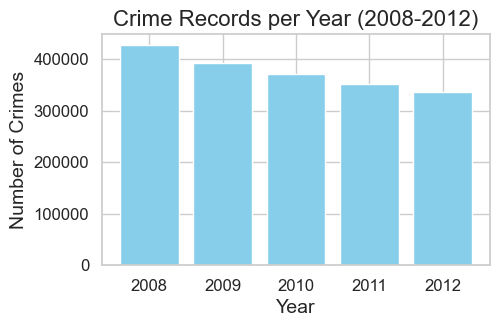

In [188]:
print('The number of recorded crimes looks decresing as the graphic shows:\n')

plt.figure(figsize=(5, 3))
plt.bar(total_crime_per_year_df.index, total_crime_per_year_df['Tot_crimes'], color='skyblue')

plt.title('Crime Records per Year (2008-2012)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Crimes', fontsize=14)
plt.xticks(total_crime_per_year_df.index, fontsize=12)
plt.yticks(fontsize=12)

plt.show()


The total crime rate seem to be steadily decreasing over the years - as shown above.

**3.4** By how many percentage points has the crime rate increased/decreased over this period? 

Hint: You only need to compare the number of crime records from 2008 with the number of crime records from 2012.

I calculate the percentage which has decreased by 21.27% from 2008 to 2012.

In [189]:
crime_rate_difference = total_crime_per_year_df['Tot_crimes'][2008] - total_crime_per_year_df['Tot_crimes'][2012]
percentage_decrease = crime_rate_difference/total_crime_per_year_df['Tot_crimes'][2008]*100
print(f"The crime rate has decreased by {percentage_decrease:1.2f}% from 2008 to 2012.")

The crime rate has decreased by 21.27% from 2008 to 2012.


**3.5** Which primary crime types have increasing crime rates, and which ones have decreasing crime rates, when comparing 2008 to 2012?

Creating two series to visualize crime rate that incrise/decrise when comparing 2008 to 2012

In [190]:
# Filter the data for the years 2008 and 2012
filtered_2008_2012_df = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Year'].isin([2008, 2012])]

# Calculat the number of crimes for each primary crime type in 2008 and 2012
crime_counts_by_year = filtered_2008_2012_df.groupby(['Year', 'Primary Type']).size().unstack(fill_value=0)

# Calculate the difference in crime counts between 2012 and 2008
crime_rate_difference = crime_counts_by_year.loc[2012] - crime_counts_by_year.loc[2008]

# Separate the crimes that have increased and decreased
increasing_crimes = crime_rate_difference[crime_rate_difference > 0]
decreasing_crimes = crime_rate_difference[crime_rate_difference < 0]

print(f"Crimes with increasing rates: \n{increasing_crimes}\n")
print(f"Crimes with decreasing rates: \n{decreasing_crimes}\n")

Crimes with increasing rates: 
Primary Type
CRIMINAL SEXUAL ASSAULT              23
HOMICIDE                              2
INTERFERENCE WITH PUBLIC OFFICER    648
NON-CRIMINAL                          6
NON-CRIMINAL (SUBJECT SPECIFIED)      2
OBSCENITY                            13
PUBLIC INDECENCY                     13
STALKING                             17
WEAPONS VIOLATION                    30
dtype: int64

Crimes with decreasing rates: 
Primary Type
ARSON                          -175
ASSAULT                       -5549
BATTERY                      -16797
BURGLARY                      -3374
CRIM SEXUAL ASSAULT            -124
CRIMINAL DAMAGE              -16988
CRIMINAL TRESPASS             -4094
DECEPTIVE PRACTICE            -1162
GAMBLING                       -475
INTIMIDATION                   -105
KIDNAPPING                     -124
LIQUOR LAW VIOLATION           -339
MOTOR VEHICLE THEFT           -2391
NARCOTICS                    -11017
OFFENSE INVOLVING CHILDREN     -32

# 4 - Chicago Police Departement performance assesment

**4.1** How many recorded crimes have in total led to an arrest? What's the corresponding arrest percentage?

In [191]:
chicago_crime_arrest_column_data_count=len(chicago_crime_2008_to_2012_df['Arrest'])

chicago_crime_tot_arrest=chicago_crime_2008_to_2012_df['Arrest'].sum()

arrest_percentage = chicago_crime_tot_arrest/chicago_crime_arrest_column_data_count*100

print(f"The percentage crimes that led to arrest is {arrest_percentage:1.2f}%")


The percentage crimes that led to arrest is 27.06%


**4.2** Has the arrest rate percentage been increasing, decreasing or remained stable over these years?

The arrest rate percentage has been quite stable over the years and i created a data frame and a grid graph to show the trend.through the years

In [192]:
# Group by 'Year' and calculate the arrest rate percentage for each year
arrest_percentage_by_year = chicago_crime_2008_to_2012_df.groupby('Year')['Arrest'].agg(['sum', 'count'])

# Calculate the arrest percentage
arrest_percentage_by_year['Arrest Percentage'] = (arrest_percentage_by_year['sum'] / arrest_percentage_by_year['count']) * 100

# Display the arrest percentages by year
arrest_percentage_by_year_df = pd.DataFrame(arrest_percentage_by_year[['Arrest Percentage']])

# Analyze the trend of the arrest percentage
arrest_trend_diff = arrest_percentage_by_year['Arrest Percentage'].diff()
net_change = arrest_percentage_by_year['Arrest Percentage'].iloc[-1] - arrest_percentage_by_year['Arrest Percentage'].iloc[0] 

# Check the trend
if net_change > 10:
    trend = 'Increasing'
elif net_change < -10:
    trend = 'Decreasing'
else:
    trend = 'Stable'

print(f"The arrest rate trend from 2008 to 2012 is {trend} with a net change in arrest percentage that slightly increase of {net_change:.2f}%")

print("\nArrest Percentages by Year:")
arrest_percentage_by_year_df


The arrest rate trend from 2008 to 2012 is Stable with a net change in arrest percentage that slightly increase of 1.20%

Arrest Percentages by Year:


,Arrest Percentage
Year,
2008,25.755270
2009,28.214984
2010,27.137544
2011,27.356968
2012,26.960115


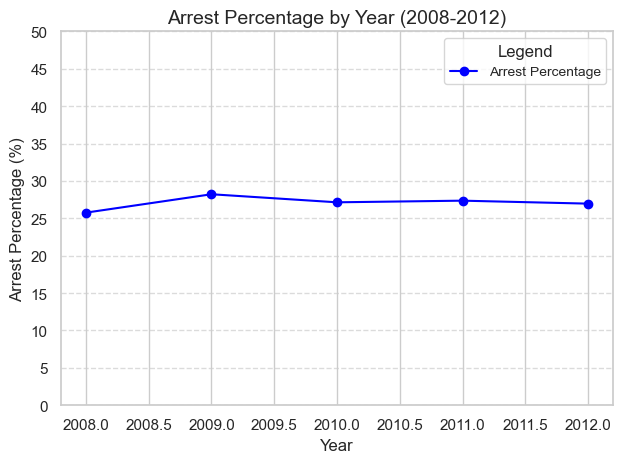

In [193]:
plt.plot(arrest_percentage_by_year_df.index, arrest_percentage_by_year_df['Arrest Percentage'], marker='o', label='Arrest Percentage', color='blue')
plt.title("Arrest Percentage by Year (2008-2012)", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Arrest Percentage (%)", fontsize=12)
plt.ylim(0, 40)
plt.yticks(range(0, 51, 5))
plt.legend(loc='upper right', fontsize=10, title="Legend")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

**4.3** For the Year 2011, which month has the highest arrest percentage?

I show that march is the month with highest numbers of crime in 2011 and create a dataframe to visualize for every month(from 1 to 12) the amount of crime and their percentage

In [194]:
# Filter data for the year 2011
crime_2011_df = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Year'] == 2011]

# Group by month and calculate the arrest percentage for each month
monthly_arrest_percentage_2011 = crime_2011_df.groupby(crime_2011_df['Date'].dt.month)['Arrest'].agg(['sum', 'count'])

# Calculate the arrest percentage for each month
monthly_arrest_percentage_2011['Arrest Percentage'] = round((monthly_arrest_percentage_2011['sum'] / monthly_arrest_percentage_2011['count']) * 100,2)

# Find the month with the highest arrest percentage
highest_arrest_month_2011 = monthly_arrest_percentage_2011['Arrest Percentage'].idxmax()

# Convert the month number to the month name using pandas .dt accessor
month_name = pd.to_datetime(f'2011-{highest_arrest_month_2011}-01').strftime('%B')

# Display the month and its arrest percentage
highest_arrest_month_percentage = monthly_arrest_percentage_2011.loc[highest_arrest_month_2011, 'Arrest Percentage']
print(f"The month with the highest arrest percentage in 2011 is {month_name} with an arrest percentage of {highest_arrest_month_percentage:.2f}%")

monthly_arrest_percentage_2011

The month with the highest arrest percentage in 2011 is March with an arrest percentage of 29.30%


,sum,count,Arrest Percentage
Date,,,
1,7862,27232,28.87
2,6496,22242,29.21
3,8410,28702,29.30
4,7912,29116,27.17
5,8154,31600,25.80
6,8566,32328,26.50
7,8862,33265,26.64
8,9043,32604,27.74
9,8288,29946,27.68


**4.4** For the same year, and the particular month of you've identified in question 2.3, which primary crime type has the highest number of arrests?

in order to identify  which primary crime type has the highest number of arrests i use a filter and then the help of grupoby, sum, idmax and max.

In [195]:
crime_2011_month_df = crime_2011_df[crime_2011_df['Date'].dt.month == highest_arrest_month_2011]

crime_arrests_by_type = crime_2011_month_df.groupby('Primary Type')['Arrest'].sum()

highest_arrest_crime_type = crime_arrests_by_type.idxmax()

highest_arrest_count = crime_arrests_by_type.max()

print(f"The primary crime type with the highest number of arrests in {month_name} 2011 is '{highest_arrest_crime_type}' with {highest_arrest_count} arrests.")

The primary crime type with the highest number of arrests in March 2011 is 'NARCOTICS' with 3747 arrests.


# 5 - Troubles at home

**5.1** How many recorded crimes are domestic?

I create a filter and use sum to answer the question

In [196]:

total_domestic_crimes = chicago_crime_2008_to_2012_df['Domestic'].sum()

print(f"Total number of recorded domestic crimes is : {total_domestic_crimes}")


Total number of recorded domestic crimes is : 309809


**5.2** How many domestic recorded crimes are of the primary type *offense involving children*?

i create a filter for domestic crimes with "Offense Involving Children, then i use len to count the number of recors

In [197]:
# Filter for domestic crimes with "Offense Involving Children"
domestic_offense_children = chicago_crime_2008_to_2012_df[
    (chicago_crime_2008_to_2012_df['Domestic'] == True) & 
    (chicago_crime_2008_to_2012_df['Primary Type'] == 'OFFENSE INVOLVING CHILDREN')
]

# Count the number of such records
total_domestic_offense_children = len(domestic_offense_children)

print(f"Total number of domestic crimes involving children: {total_domestic_offense_children}")


Total number of domestic crimes involving children: 10957


**5.3** How much more likely is it that an offense involving children is domestic?

I calculate how much more likely is it that an offense involving children is domestic by calculate the percentage of it

In [198]:
# Filter for all offenses involving children
offenses_involving_children = chicago_crime_2008_to_2012_df[
    chicago_crime_2008_to_2012_df['Primary Type'] == 'OFFENSE INVOLVING CHILDREN'
]

# Calculate total offenses involving children
total_offenses_involving_children = len(offenses_involving_children)

# Calculate domestic offenses involving children
domestic_offenses_involving_children = len(
    offenses_involving_children[offenses_involving_children['Domestic'] == True]
)

# Calculate the likelihood of an offense involving children being domestic
domestic_likelihood = domestic_offenses_involving_children / total_offenses_involving_children * 100

# Calculate the likelihood of an offense involving children not being domestic
non_domestic_likelihood = 100 - domestic_likelihood

# Calculate the ratio of domestic likelihood to non-domestic likelihood
domestic_vs_non_domestic_ratio = domestic_likelihood / non_domestic_likelihood

print(f"Offenes involving children are {domestic_vs_non_domestic_ratio:.2f} times more likely to be domestic.")


Offenes involving children are 6.21 times more likely to be domestic.


**5.4** What's the worst weekday in terms of number of domestic offenses involving children? How does it compare to the other weekdays?

I am showing for every weekday the amount of crimes ivolving children and highlight the one with the higher number.

In [199]:
# Filter for domestic offenses involving children
domestic_offenses_children = chicago_crime_2008_to_2012_df[
    (chicago_crime_2008_to_2012_df['Primary Type'] == 'OFFENSE INVOLVING CHILDREN') &
    (chicago_crime_2008_to_2012_df['Domestic'] == True)
]

# Extract weekday names for these offenses
domestic_offenses_children['Weekday'] = domestic_offenses_children['Date'].dt.day_name()

# Count the number of offenses for each weekday
weekday_counts = domestic_offenses_children['Weekday'].value_counts()

# Identify the worst weekday
worst_weekday = weekday_counts.idxmax()
worst_weekday_count = weekday_counts.max()

# Compare the worst weekday to the average offenses across all weekdays
average_weekday_count = weekday_counts.mean()
comparison_to_average = worst_weekday_count / average_weekday_count

print(f"The worst weekday for domestic offenses involving children is {worst_weekday} with {worst_weekday_count} offenses.")
print(f"On average, there are {average_weekday_count:.2f} offenses on any weekday.")
print(f"{worst_weekday} has {comparison_to_average:.2f} times the average number of offenses.")

weekday_counts

The worst weekday for domestic offenses involving children is Friday with 2028 offenses.
On average, there are 1565.29 offenses on any weekday.
Friday has 1.30 times the average number of offenses.


Weekday
Friday       2028
Saturday     1720
Sunday       1687
Thursday     1438
Tuesday      1397
Wednesday    1375
Monday       1312
Name: count, dtype: int64

**5.5** What's the distribution, in terms of number of records, for domestic crimes of sexual character that involves children? What's the arrest rate (%) for each? 

I show the distribution of crimes with sexual character that involves children through Data frame. The data frame shows description, number of crimes and percentage.

In [200]:
domestic_sexual_children = chicago_crime_2008_to_2012_df[
    (chicago_crime_2008_to_2012_df['Primary Type'] == 'OFFENSE INVOLVING CHILDREN') & 
    (chicago_crime_2008_to_2012_df['Description'].str.contains('SEXUAL', na=False)) &
    (chicago_crime_2008_to_2012_df['Domestic'] == True)
]

print(f"This is the number of records that fullfill the three conditions mentioned above: {domestic_sexual_children.shape[0]}\n")

domestic_sexual_children_arrest_percentage = round((domestic_sexual_children['Arrest'].sum()) / (len(domestic_sexual_children))*100,2)

print(f"The percentage of arrests for domestic crimes of sexual character that involves children is :{domestic_sexual_children_arrest_percentage}%\n")

crime_distribution = domestic_sexual_children['Description'].value_counts()

arrest_rate_by_description = round(domestic_sexual_children.groupby('Description')['Arrest'].mean() * 100,2)

distribution_and_arrest_df = pd.DataFrame({
    'Number of Records': crime_distribution,
    'Arrest Rate (%)': arrest_rate_by_description
}).sort_values('Number of Records', ascending=False)

distribution_and_arrest_df


This is the number of records that fullfill the three conditions mentioned above: 371

The percentage of arrests for domestic crimes of sexual character that involves children is :27.49%



,Number of Records,Arrest Rate (%)
Description,,
AGGRAVATED SEXUAL ASSAULT OF CHILD BY FAMILY MEMBER,152,34.21
AGGRAVATED CRIMINAL SEXUAL ABUSE BY FAMILY MEMBER,131,24.43
SEXUAL ASSAULT OF CHILD BY FAMILY MEMBER,63,23.81
CRIMINAL SEXUAL ABUSE BY FAMILY MEMBER,25,12.00


**5.6** What period of the day does the specific kind of (domestic) offense against children, with the most recorded arrests, tend do occur? How does it look for all weekdays individually?
        Can you find certain periods of the week that are especially bad? 

    Note: the details of this question is up to you to interpret

I created a heatmap of arrest for child abuse. Also a Series that shows the total offenses by weekday and total offenses by period of time


As the below grafic shows, afternoon is a critically bad period almost everyday, with a total of 1169 crimes weekly.
Evenings are looking also very critical, with their pick result in Wednesdays with 184 crimes.


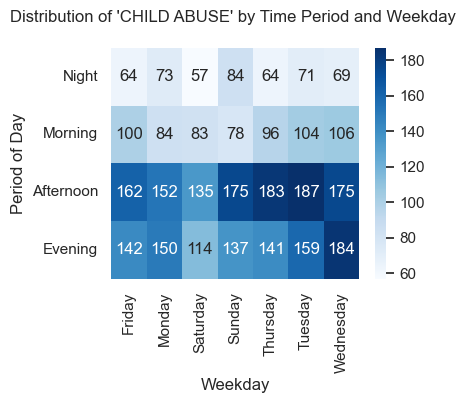

Total offenses by time period:
Period
Night         482
Morning       651
Afternoon    1169
Evening      1027
dtype: int64

Total offenses by weekday:
Weekday
Friday       468
Monday       459
Saturday     389
Sunday       474
Thursday     484
Tuesday      521
Wednesday    534
dtype: int64


In [201]:
chicago_crime_2008_to_2012_df['Weekday'] = chicago_crime_2008_to_2012_df['Date'].dt.day_name()

# Filter data for domestic offenses against children
domestic_offenses_children = chicago_crime_2008_to_2012_df[
    (chicago_crime_2008_to_2012_df['Primary Type'] == 'OFFENSE INVOLVING CHILDREN') &
    (chicago_crime_2008_to_2012_df['Domestic'] == True)
]

# Identify the offense with the most arrests
most_arrests_offense = domestic_offenses_children.loc[
    domestic_offenses_children['Arrest'] == True, 'Description'
].value_counts().idxmax()

# Filter for records of this specific offense
offense_with_most_arrests = domestic_offenses_children[
    domestic_offenses_children['Description'] == most_arrests_offense
]

# Extract time and create a time period column
offense_with_most_arrests['Hour'] = offense_with_most_arrests['Date'].dt.hour
offense_with_most_arrests['Period'] = pd.cut(
    offense_with_most_arrests['Hour'],
    bins=[0, 6, 12, 18, 24],
    labels=['Night', 'Morning', 'Afternoon', 'Evening'],
    right=False
)

# Group data by period and weekday
time_period_distribution = offense_with_most_arrests.groupby(['Period', 'Weekday']).size().unstack(fill_value=0)

# Calculate totals by time period and weekday
weekday_period_totals = time_period_distribution.sum(axis=0)
daytime_period_totals = time_period_distribution.sum(axis=1)

print(f'\nAs the below grafic shows, afternoon is a critically bad period almost everyday, with a total of {daytime_period_totals['Afternoon']} crimes weekly.')
print(f'Evenings are looking also very critical, with their pick result in Wednesdays with {time_period_distribution.loc['Evening','Wednesday']} crimes.')

plt.figure(figsize=(4, 3))
sns.heatmap(time_period_distribution, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.title(f"Distribution of '{most_arrests_offense}' by Time Period and Weekday \n")
plt.ylabel('Period of Day')
plt.xlabel('Weekday')
plt.show()


print("Total offenses by time period:")
print(daytime_period_totals)
print("\nTotal offenses by weekday:")
print(weekday_period_totals)


**5.7** Looking at any given year as a whole, what's the worst period in terms of domestic number of offenses involving children? Can you find any trends? Does the trend seem to be consistent for every other year? 

    Note: the details of this question is up to you to interpret

I created a bar graph showing trend that is stable but that mildly increase trought the years and decrease from 2010 to 2012

In [202]:
chicago_crime_2008_to_2012_df['Hour'] = chicago_crime_2008_to_2012_df['Date'].dt.hour
chicago_crime_2008_to_2012_df['Period'] = pd.cut(
    chicago_crime_2008_to_2012_df['Hour'],
    bins=[0, 6, 12, 18, 24],
    labels=['Night', 'Morning', 'Afternoon', 'Evening'],
    right=False
)

domestic_offenses_children = chicago_crime_2008_to_2012_df[
    (chicago_crime_2008_to_2012_df['Primary Type'] == 'OFFENSE INVOLVING CHILDREN') &
    (chicago_crime_2008_to_2012_df['Domestic'] == True)
]

# Group by year and period to calculate offense counts
period_trends = domestic_offenses_children.groupby(['Year', 'Period']).size().unstack(fill_value=0)

# Identify the worst period for each year
worst_period_per_year = period_trends.idxmax(axis=1)
worst_period_counts = period_trends.max(axis=1)

# Display trends
print("Worst period in terms of domestic offenses involving children by year:\n")
for year in period_trends.index:
    print(f"Year {year}: Worst period is '{worst_period_per_year[year]}' with {worst_period_counts[year]} offenses.")


period_totals = period_trends.sum(axis=0)
print("\nTotal offenses by peiod across all years:")
print(period_totals)
print("\nPercentage of offenses by period:")
print(round((period_totals / period_totals.sum()) * 100),3)



Worst period in terms of domestic offenses involving children by year:

Year 2008: Worst period is 'Afternoon' with 702 offenses.
Year 2009: Worst period is 'Afternoon' with 760 offenses.
Year 2010: Worst period is 'Afternoon' with 776 offenses.
Year 2011: Worst period is 'Afternoon' with 724 offenses.
Year 2012: Worst period is 'Afternoon' with 653 offenses.

Total offenses by peiod across all years:
Period
Night        2109
Morning      2219
Afternoon    3615
Evening      3014
dtype: int64

Percentage of offenses by period:
Period
Night        19.0
Morning      20.0
Afternoon    33.0
Evening      28.0
dtype: float64 3


The grafic above shows a very mild down trend, even though:
AFTERNOON CRIMES: increase trought the years and decrease from 2010 to 2012.


<Figure size 900x500 with 0 Axes>

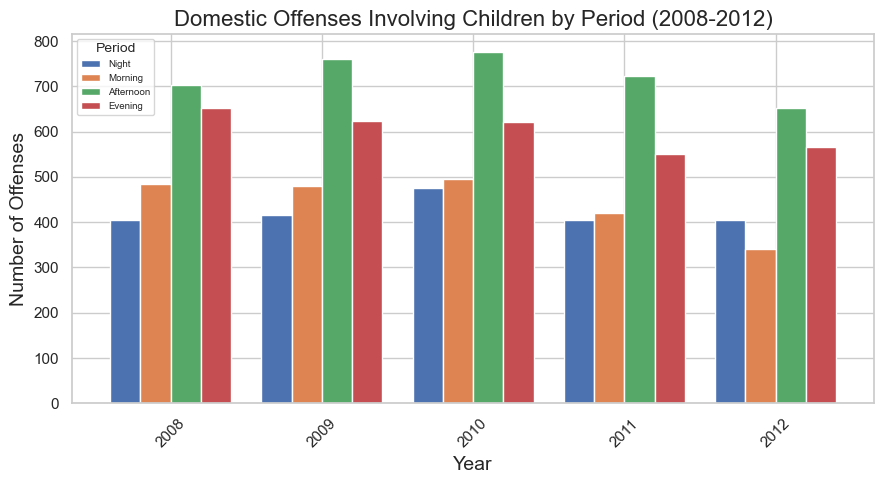

In [203]:
print('The grafic above shows a very mild down trend, even though:')
print('AFTERNOON CRIMES: increase trought the years and decrease from 2010 to 2012.')

plt.figure(figsize=(9 ,5))
sns.set_theme(style="whitegrid")
period_trends.plot(kind='bar', stacked=False, figsize=(9,5), width=0.8)

plt.title('Domestic Offenses Involving Children by Period (2008-2012)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Offenses', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Period', title_fontsize='10', fontsize='7')
plt.tight_layout()
plt.show()

# 6 - Bad Boys Bad Boys whatcha gonna do

**6.1** In general, what weekday is a crime most likely to occur? Which day is the safest?

The bar graph shows which weekday a crime occurs the most and which day is the safest.

Crimes by weekday:
Weekday
Monday       263018
Tuesday      271301
Wednesday    273628
Thursday     269174
Friday       284113
Saturday     266336
Sunday       251383
Name: count, dtype: int64

The most dangerous day is Friday with 284113 crimes.
The safest day is Sunday with 251383 crimes.


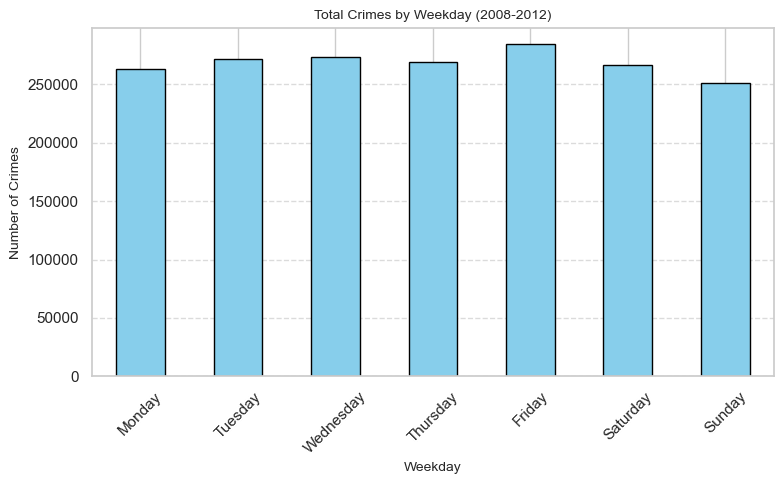

In [204]:
# weekly crimes counts
weekday_crime_totals = chicago_crime_2008_to_2012_df['Weekday'].value_counts()

# weekly day order
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_crime_totals = weekday_crime_totals.reindex(weekday_order)

# identify the most dangerus and the safest day
most_dangerous_day = weekday_crime_totals.idxmax()
least_dangerous_day = weekday_crime_totals.idxmin()
most_dangerous_count = weekday_crime_totals.max()
least_dangerous_count = weekday_crime_totals.min()

print("Crimes by weekday:")
print(weekday_crime_totals)

print(f"\nThe most dangerous day is {most_dangerous_day} with {most_dangerous_count} crimes.")
print(f"The safest day is {least_dangerous_day} with {least_dangerous_count} crimes.")

weekday_crime_totals.plot(kind='bar', figsize=(8,5), color='skyblue', edgecolor='black')
plt.title("Total Crimes by Weekday (2008-2012)", fontsize=10)
plt.xlabel("Weekday", fontsize=10)
plt.ylabel("Number of Crimes", fontsize=10)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


**6.2** Which is the most unsafe weekday for you if you'd like to avoid the following:

a) getting your phone stolen by sneaky pickpockets (THEFT) 

b) having your handbag forcibly pulled away (ROBBERY) 

c) getting jumped in an alley (ASSAULT)

creating subplots to show :

a) Most dangerous day for theft: Friday with 61648 crimes.
b) Most dangerous day for robbery: Friday with 10975 crimes.
c) Most dangerous day for assault: Wednesday with 16969 crimes.


a) Most dangerous day for theft: Friday with 61648 crimes.
b) Most dangerous day for robbery: Friday with 10975 crimes.
c) Most dangerous day for assault: Wednesday with 16969 crimes.


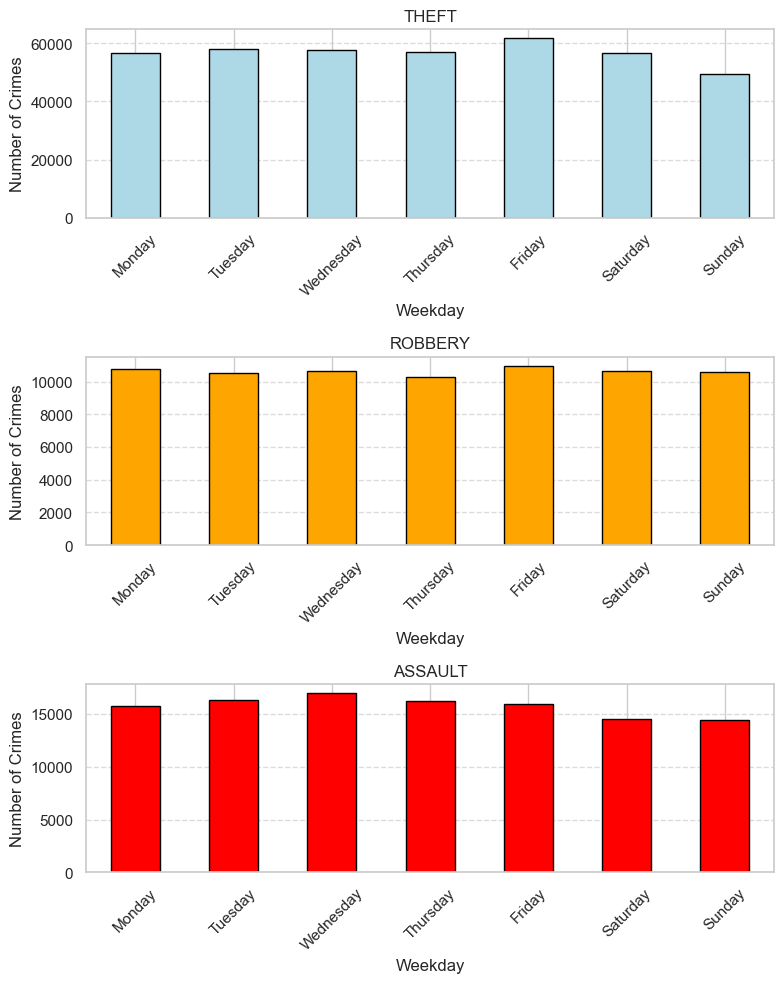

In [205]:

theft_data = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Primary Type'] == 'THEFT']
robbery_data = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Primary Type'] == 'ROBBERY']
assault_data = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Primary Type'] == 'ASSAULT']

# crimes per week day count
theft_by_weekday = theft_data['Weekday'].value_counts().reindex(weekday_order)
robbery_by_weekday = robbery_data['Weekday'].value_counts().reindex(weekday_order)
assault_by_weekday = assault_data['Weekday'].value_counts().reindex(weekday_order)

most_dangerous_day_theft = theft_by_weekday.idxmax()
most_dangerous_day_robbery = robbery_by_weekday.idxmax()
most_dangerous_day_assault = assault_by_weekday.idxmax()

print(f"a) Most dangerous day for theft: {most_dangerous_day_theft} with {theft_by_weekday.max()} crimes.")
print(f"b) Most dangerous day for robbery: {most_dangerous_day_robbery} with {robbery_by_weekday.max()} crimes.")
print(f"c) Most dangerous day for assault: {most_dangerous_day_assault} with {assault_by_weekday.max()} crimes.")

fig, ax = plt.subplots(3, 1, figsize=(8, 10))
theft_by_weekday.plot(kind='bar', color='lightblue', ax=ax[0], edgecolor='black', title="THEFT")
robbery_by_weekday.plot(kind='bar', color='orange', ax=ax[1], edgecolor='black', title="ROBBERY")
assault_by_weekday.plot(kind='bar', color='red', ax=ax[2], edgecolor='black', title="ASSAULT")

for axis in ax:
    axis.set_xlabel("Weekday")
    axis.set_ylabel("Number of Crimes")
    axis.grid(axis='y', linestyle='--', alpha=0.7)
    axis.set_xticklabels(weekday_order, rotation=45)

plt.tight_layout()
plt.show()


**6.3** Which are the worst 10 dates (most recorded crimes) of 2008? Does this trend hold for the other years?

Showing the worst 10 dates of 2008 and and showing that this trend holds through the years.

In [206]:
# Filter data for the year 2008
crimes_2008 = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Year'] == 2008]

# Calculate the number of crimes for each date
crimes_by_date_2008 = crimes_2008.groupby('Date').size().sort_values(ascending=False)

# Get the top 10 dates with the highest number of crimes
worst_dates_2008 = crimes_by_date_2008.head(10)
print("Worst 10 dates in 2008 (most recorded crimes):")
print(worst_dates_2008)

# Repeat the same process for each year from 2008 to 2012
worst_dates_by_year = {}
for year in range(2008, 2013):
    crimes_year = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Year'] == year]
    crimes_by_date = crimes_year.groupby('Date').size().sort_values(ascending=False)
    worst_dates_by_year[year] = crimes_by_date.head(10)

# Compare the worst dates across years
print("\nComparison of worst dates across years (2008-2012):")
for year, dates in worst_dates_by_year.items():
    print(f"\nYear {year} - Worst 10 Dates:")
    print(dates)

# Provide a comparison statement about the trend
print("\nThis trend tends to hold through the years. The only significant change is the decrease of crime records registered specifically on the 1st of January 2008 in comparison to the 1st of January of the years 2009/2010/2011/2012.")


Worst 10 dates in 2008 (most recorded crimes):
Date
2008-01-01 00:01:00    305
2008-01-01 00:00:00    180
2008-01-01 09:00:00    127
2008-09-01 00:00:00     84
2008-01-01 12:00:00     83
2008-10-01 00:00:00     76
2008-07-01 00:00:00     72
2008-03-01 00:01:00     71
2008-08-01 00:00:00     68
2008-06-01 00:00:00     67
dtype: int64

Comparison of worst dates across years (2008-2012):

Year 2008 - Worst 10 Dates:
Date
2008-01-01 00:01:00    305
2008-01-01 00:00:00    180
2008-01-01 09:00:00    127
2008-09-01 00:00:00     84
2008-01-01 12:00:00     83
2008-10-01 00:00:00     76
2008-07-01 00:00:00     72
2008-03-01 00:01:00     71
2008-08-01 00:00:00     68
2008-06-01 00:00:00     67
dtype: int64

Year 2009 - Worst 10 Dates:
Date
2009-01-01 00:01:00    198
2009-01-01 00:00:00    168
2009-01-01 09:00:00    122
2009-01-01 12:00:00     86
2009-01-01 08:00:00     68
2009-08-01 00:01:00     68
2009-10-01 12:00:00     65
2009-07-01 00:00:00     65
2009-05-01 00:00:00     65
2009-06-01 00:00:0

**6.4** From the perspective of total number of crime records, which are the Top 10 primary crime types? Which are the Bottom 10? 

Consider this question for the years 2008-2012 as a whole. 

Swoing through 2 Data Frame the top 10 primary crimes types and the bottom 10 for the years from 2008 to 2012

In [207]:
# Group by 'Primary Type' and calculate the total number of records for each crime type
crime_type_totals = chicago_crime_2008_to_2012_df.groupby('Primary Type').size()

# Sort in descending order to find the Top 10 crime types
top_10_crime_types = crime_type_totals.sort_values(ascending=False).head(10)

# Sort in ascending order to find the Bottom 10 crime types
bottom_10_crime_types = crime_type_totals.sort_values(ascending=True).head(10)

# Create DataFrames for Top 10 and Bottom 10
top_10_crime_types_df = top_10_crime_types.reset_index(name='Crimes record')
bottom_10_crime_types_df = bottom_10_crime_types.reset_index(name='Crimes record')

# Print the top 10 crime types
print('Top 10 crimes')

# Return the DataFrame containing the Top 10 crime types
top_10_crime_types_df


Top 10 crimes


,Primary Type,Crimes record
0,THEFT,396788
1,BATTERY,329384
2,CRIMINAL DAMAGE,214408
3,NARCOTICS,207541
4,BURGLARY,128871
5,OTHER OFFENSE,111875
6,ASSAULT,110156
7,MOTOR VEHICLE THEFT,89270
8,ROBBERY,74426
9,DECEPTIVE PRACTICE,67915


In [208]:
print('Bottom 10 crimes')

bottom_10_crime_types_df

Bottom 10 crimes


,Primary Type,Crimes record
0,HUMAN TRAFFICKING,1
1,NON-CRIMINAL (SUBJECT SPECIFIED),2
2,NON-CRIMINAL,8
3,OTHER NARCOTIC VIOLATION,36
4,PUBLIC INDECENCY,51
5,OBSCENITY,134
6,CRIMINAL SEXUAL ASSAULT,325
7,STALKING,935
8,INTIMIDATION,1017
9,KIDNAPPING,1467


**6.5** For all those crime categories you identified in 6.4, how does their distribution instead look per year - rather than the full 2008-2012 period as a whole?

I am plotting the distribution per year. One graph shows the top 10 , another one the bottom 10.

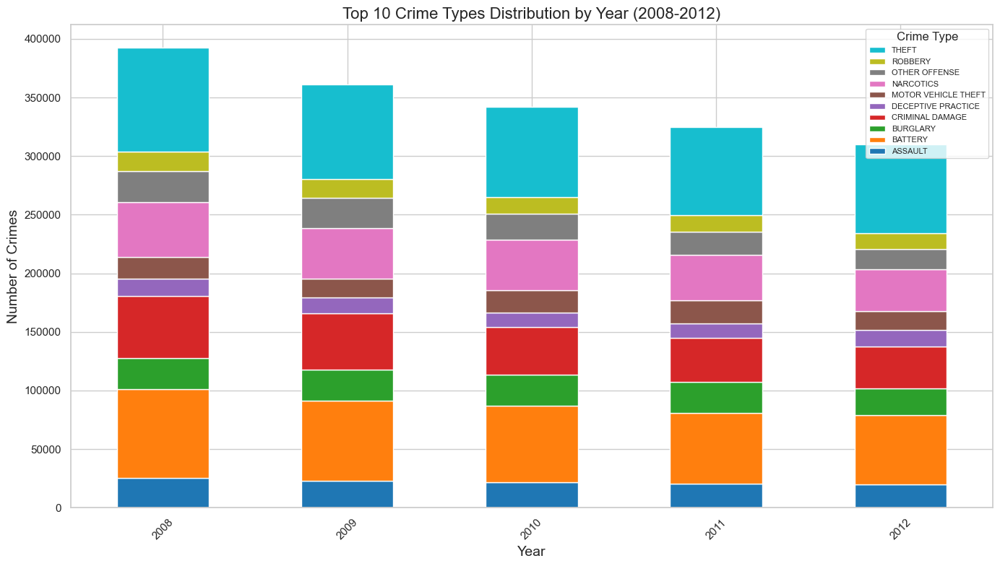

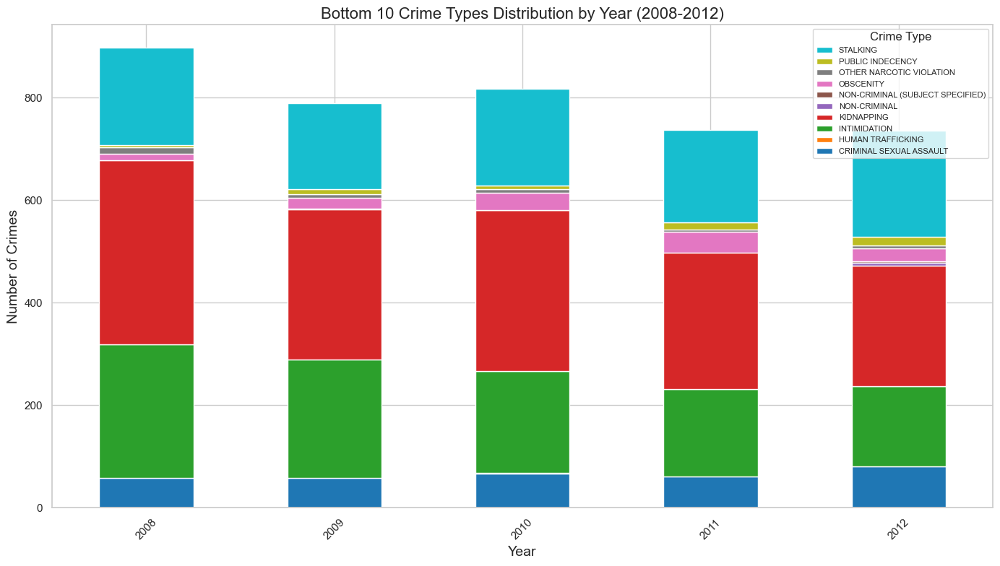

In [209]:
# List of Top 10 and Bottom 10 crimes
top_10_crimes = top_10_crime_types.index
bottom_10_crimes = bottom_10_crime_types.index

# Filter crimes Top 10 and Bottom 10
top_10_data = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Primary Type'].isin(top_10_crimes)]
bottom_10_data = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Primary Type'].isin(bottom_10_crimes)]

# Annual distribution Top 10
top_10_yearly_distribution = top_10_data.groupby(['Year', 'Primary Type']).size().unstack(fill_value=0)

# Annual distribution Bottom 10
bottom_10_yearly_distribution = bottom_10_data.groupby(['Year', 'Primary Type']).size().unstack(fill_value=0)

top_10_yearly_distribution.plot(kind='bar', stacked=True, figsize=(14,8), colormap='tab10')
plt.title("Top 10 Crime Types Distribution by Year (2008-2012)", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Number of Crimes", fontsize=14)
plt.xticks(rotation=45)
plt.legend(title="Crime Type", loc='upper right', fontsize=8, reverse=True) 
plt.tight_layout()
plt.show()

bottom_10_yearly_distribution.plot(kind='bar', stacked=True, figsize=(14,8), colormap='tab10')
plt.title("Bottom 10 Crime Types Distribution by Year (2008-2012)", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Number of Crimes", fontsize=14)
plt.xticks(rotation=45)
plt.legend(title="Crime Type", loc='upper right', fontsize=8, reverse=True) 
plt.tight_layout()
plt.show()


**6.6** Which primary crime types does the city of Chicago seem to get better at preventing? For which ones is it the opposite, i.e, the situation is getting worse? 

After an analysis i realized that two columns 'CRIM SEXUAL ASSAULT' and 'CRIMINAL SEXUAL ASSAULT' are holding records for the same crime.
I below attach a link with is a list of the IUCR from the Chicage police web-site and 'CRIM SEXUAL ASSAULT' is not present.
https://data.cityofchicago.org/Public-Safety/Chicago-Police-Department-Illinois-Uniform-Crime-R/c7ck-438e/data_preview.

Using 2 data frame to show which crimes are getting better prvention and which ones are not, then tp visualize it i merge the 2 data frame into a graph.

In [210]:

#Isolate primary crimes
primary_crime_yearly_data = chicago_crime_2008_to_2012_df.groupby(['Year', 'Primary Type']).size().unstack(fill_value=0)

# Add up the 2 columns that are holding records for the same crime
primary_crime_yearly_data['CRIMINAL SEXUAL ASSAULT'] = primary_crime_yearly_data['CRIMINAL SEXUAL ASSAULT'] + primary_crime_yearly_data['CRIM SEXUAL ASSAULT']

#Now we drop a usless column since the records from the both columns have been added togheter in the columns 'CRIMINAL SEXUAL ASSAULT'
primary_crime_yearly_data = primary_crime_yearly_data.drop(columns=['CRIM SEXUAL ASSAULT'])

primary_crime_yearly_data


Primary Type,ARSON,ASSAULT,BATTERY,BURGLARY,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,GAMBLING,HOMICIDE,...,OTHER NARCOTIC VIOLATION,OTHER OFFENSE,PROSTITUTION,PUBLIC INDECENCY,PUBLIC PEACE VIOLATION,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION
Year,,,,,,,,,,,,,,,,,,,,,
2008,644,25448,75930,26218,52843,1566,12310,14936,1199,513,...,12,26532,5141,4,3013,16703,1503,190,88437,3877
2009,616,22861,68459,26767,47725,1451,10851,13885,991,461,...,7,25601,3940,10,3147,15981,1267,168,80976,4159
2010,522,21537,65402,26422,40654,1392,9401,12585,927,438,...,6,22012,2484,7,3538,14275,1142,189,76758,3704
2011,504,20411,60460,26620,37331,1509,8659,12735,736,438,...,5,20206,2424,13,3095,13983,1100,181,75153,3880
2012,469,19899,59133,22844,35855,1465,8216,13774,724,515,...,6,17524,2204,17,3007,13484,1087,207,75464,3907


In [211]:
# Calculate the absolute change in the number of crimes from 2008 to 2012
crime_trends = primary_crime_yearly_data.loc[2012] - primary_crime_yearly_data.loc[2008]

# Separate crimes into two groups: improved (reduced) and worsened (increased)
improved_crimes = crime_trends[crime_trends < 0]  # Crimes that decreased
worsened_reducing_crimes = crime_trends[crime_trends > 0]  # Crimes that increased

improved_crimes = improved_crimes.sort_values()  # Ascending for reduced crimes
worsened_reducing_crimes = worsened_reducing_crimes.sort_values(ascending=False)  # Descending for increased crimes

print("Improvement in reducing crimes from 2008 to 2012:\n")
improved_crimes_df = pd.DataFrame(improved_crimes).reset_index()
improved_crimes_df.columns = ['Primary Type', 'Improvment']
improved_crimes_df


Improvement in reducing crimes from 2008 to 2012:



,Primary Type,Improvment
0,CRIMINAL DAMAGE,-16988
1,BATTERY,-16797
2,THEFT,-12973
3,NARCOTICS,-11017
4,OTHER OFFENSE,-9008
5,ASSAULT,-5549
6,CRIMINAL TRESPASS,-4094
7,BURGLARY,-3374
8,ROBBERY,-3219
9,PROSTITUTION,-2937


In [212]:
print("Records of crimes that did not reduce from 2008 to 2012:\n")
worsened_reducing_crimes_df = pd.DataFrame(worsened_reducing_crimes).reset_index()
worsened_reducing_crimes_df.columns = ['Primary Type', 'Worsened']
worsened_reducing_crimes_df

Records of crimes that did not reduce from 2008 to 2012:



,Primary Type,Worsened
0,INTERFERENCE WITH PUBLIC OFFICER,648
1,WEAPONS VIOLATION,30
2,STALKING,17
3,OBSCENITY,13
4,PUBLIC INDECENCY,13
5,NON-CRIMINAL,6
6,HOMICIDE,2
7,NON-CRIMINAL (SUBJECT SPECIFIED),2


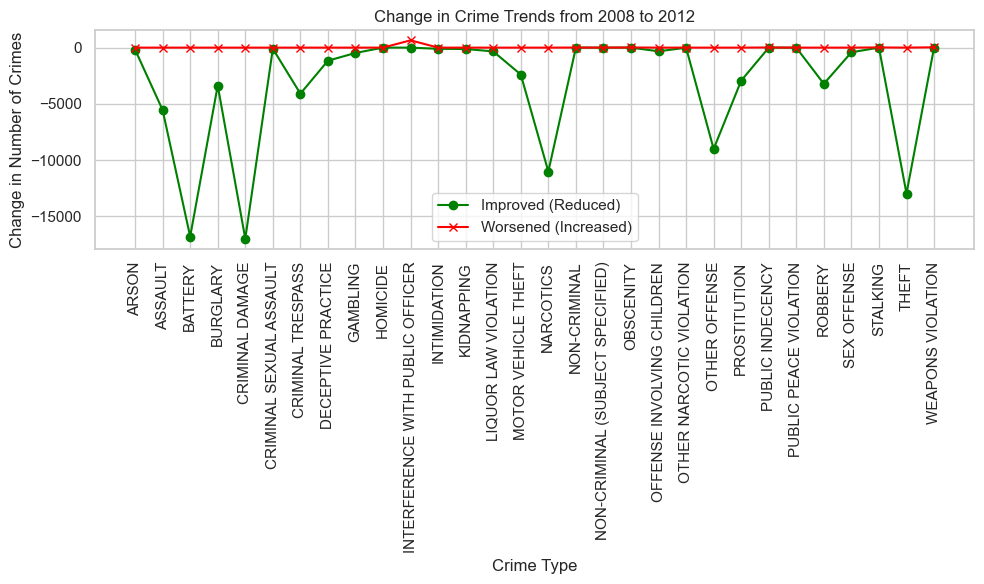

In [213]:
# Merge the two dataframes on 'Primary Type'
combined_crimes_df = pd.merge(improved_crimes_df, worsened_reducing_crimes_df, on='Primary Type', how='outer')

# Replace NaN with 0 for columns that are missing values 
combined_crimes_df['Improvment'].fillna(0, inplace=True)
combined_crimes_df['Worsened'].fillna(0, inplace=True)

plt.figure(figsize=(10, 6))
plt.plot(combined_crimes_df['Primary Type'], combined_crimes_df['Improvment'], label='Improved (Reduced)', marker='o', color='green')
plt.plot(combined_crimes_df['Primary Type'], combined_crimes_df['Worsened'], label='Worsened (Increased)', marker='x', color='red')
plt.xticks(rotation=90)
plt.xlabel('Crime Type')
plt.ylabel('Change in Number of Crimes')
plt.title('Change in Crime Trends from 2008 to 2012')
plt.legend()
plt.tight_layout()
plt.show()


# 7 - Night Stalker

**7.1** Are there more or less crimes reported during daytime, compared with nighttime? Daytime is considered as all hours between 06:00-18:00, nighttime is the rest of the day.

It has been very hard to determinate which hours represent better the daytime and the nighttime since it would have been wrong to consider daytime longer than nighttime, as the question probably states. I tried day time as 6AM / 17:59:59 as i tried daytime as 6AM/18:00. Obviosly the result was different. I decided to use 6AM/17:59:59 which i consider the right format to divide exactly daytime and nighttime equally. I then show through a bar graph the percentage of which time of the day has more crime recorded.
Then i creatic a graphic with two lines ,representing daytime and nighttime, the quantity of crimes for each primary type.
As last i show a barplot of the nighttime crimes, just to visualize which one occur the most.

Crimes during day time (6 AM - 5:59:59 PM): 962890
Crimes during night time (5:59:59 PM - 6 AM): 916063
During daytime there have been 46827 more crimes than during nighttime.


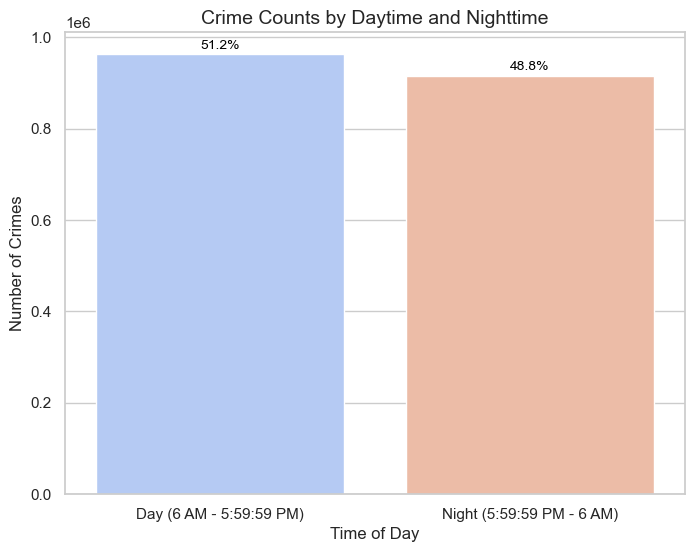

In [214]:
# Crimes (6 AM - 5:59:59 PM)
day_time_mask = (chicago_crime_2008_to_2012_df['Date'].dt.hour >= 6) & (chicago_crime_2008_to_2012_df['Date'].dt.hour < 18)
day_time_crimes = day_time_mask.sum()

# Crimes (5:59:59 PM - 6 AM)
night_time_mask = (chicago_crime_2008_to_2012_df['Date'].dt.hour >= 18) | (chicago_crime_2008_to_2012_df['Date'].dt.hour < 6)
night_time_crimes = night_time_mask.sum()

print(f"Crimes during day time (6 AM - 5:59:59 PM): {day_time_crimes}")
print(f"Crimes during night time (5:59:59 PM - 6 AM): {night_time_crimes}")
print(f'During daytime there have been {day_time_crimes - night_time_crimes} more crimes than during nighttime.')

# Create a DF for the visualization, including percentages for better readability
time_of_day_data = pd.DataFrame({
    'Time of Day': ['Day (6 AM - 5:59:59 PM)', 'Night (5:59:59 PM - 6 AM)'],
    'Crime Count': [day_time_crimes, night_time_crimes],
    'Percentage': [
        day_time_crimes / (day_time_crimes + night_time_crimes) * 100,
        night_time_crimes / (day_time_crimes + night_time_crimes) * 100
    ]
})

plt.figure(figsize=(8, 6))  # Set figure size
sns.barplot(data=time_of_day_data, x='Time of Day', y='Crime Count', palette='coolwarm')  # Create a barplot

# Annotate the percentages on top of the bars
for index, row in time_of_day_data.iterrows():
    plt.text(index, row['Crime Count'] + 5000, f"{row['Percentage']:.1f}%", 
             ha='center', va='bottom', fontsize=10, color='black')

plt.title('Crime Counts by Daytime and Nighttime', fontsize=14)
plt.xlabel('Time of Day', fontsize=12)
plt.ylabel('Number of Crimes', fontsize=12)
plt.show()


**7.2** Are there any specific primary crime types that most often occur during nights? Which ones are they?

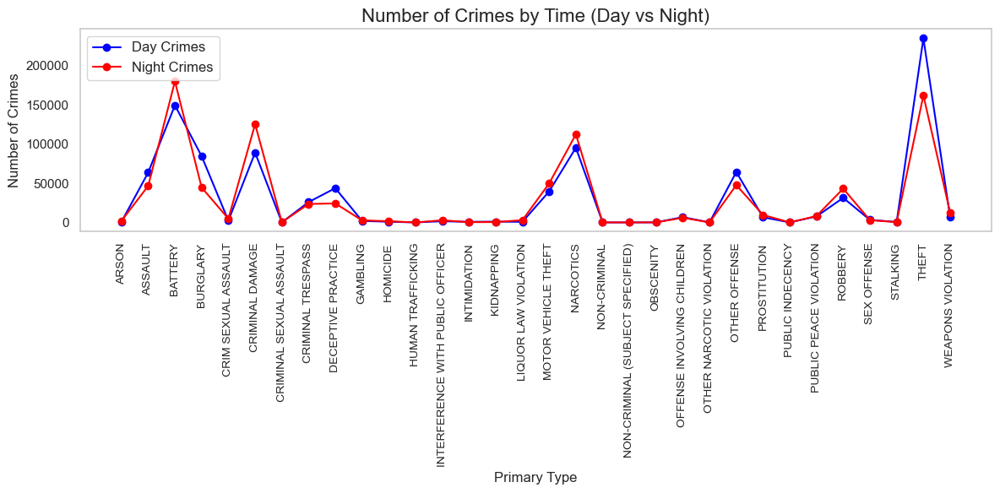

In [215]:

# Group by 'Primary Type' and calculate counts for day and night
day_crime_counts = chicago_crime_2008_to_2012_df[day_time_mask].groupby('Primary Type').size()
night_crime_counts = chicago_crime_2008_to_2012_df[night_time_mask].groupby('Primary Type').size()

# Create a comparison DataFrame
crime_time_comparison = pd.DataFrame({
    'Day Crimes': day_crime_counts,
    'Night Crimes': night_crime_counts
}).fillna(0)

# Reset index for easier plotting
crime_time_comparison.reset_index(inplace=True)
crime_time_comparison.rename(columns={'index': 'Primary Type'}, inplace=True)

plt.figure(figsize=(12, 6))

plt.plot(
    crime_time_comparison['Primary Type'], 
    crime_time_comparison['Day Crimes'], 
    label='Day Crimes', 
    color='blue', 
    marker='o'
)

plt.plot(
    crime_time_comparison['Primary Type'], 
    crime_time_comparison['Night Crimes'], 
    label='Night Crimes', 
    color='red', 
    marker='o'
)

plt.title('Number of Crimes by Time (Day vs Night)', fontsize=16)
plt.xlabel('Primary Type', fontsize=12)
plt.ylabel('Number of Crimes', fontsize=12)
plt.xticks(rotation=90, fontsize=10)
plt.legend(fontsize=12)
plt.grid()
plt.tight_layout()
plt.show()


In [216]:
# Group by 'Primary Type' and calculate counts for day and night
night_crime_counts = chicago_crime_2008_to_2012_df[night_time_mask].groupby('Primary Type').size()

# Filter to include only crimes that occurred at night
night_dominant_crimes = night_crime_counts[night_crime_counts > 0]

# Sort by the number of night crimes in descending order
night_dominant_crimes_df = night_dominant_crimes.reset_index()

night_dominant_crimes_df.columns = ['Primary Types','Tot. crimes']
night_dominant_crimes_df= night_dominant_crimes_df.sort_values(by='Tot. crimes', ascending = False)
night_dominant_crimes_df.set_index('Primary Types', inplace=True)

five_night_dominant_crimes_df = night_dominant_crimes_df.head(4)
print(f"This are the four most comitted crimes during nighttime in Chicago:")
five_night_dominant_crimes_df

This are the four most comitted crimes during nighttime in Chicago:


,Tot. crimes
Primary Types,
BATTERY,179977
THEFT,161967
CRIMINAL DAMAGE,125360
NARCOTICS,112306


In [217]:
night_time_mask

0           True
1          False
2          False
3           True
4           True
           ...  
1878948    False
1878949     True
1878950     True
1878951     True
1878952    False
Name: Date, Length: 1878953, dtype: bool

As you can see from the diagram below, there is a gruop of 4 "Primary Types" that reached over 100000 crimes committed during nighttime.
A second group of 5 "Primary Types" has between 50000 and 25000 crimes committed during nighttime.
The last group of "Primary Types" has less than 20000 crimes committed during night time



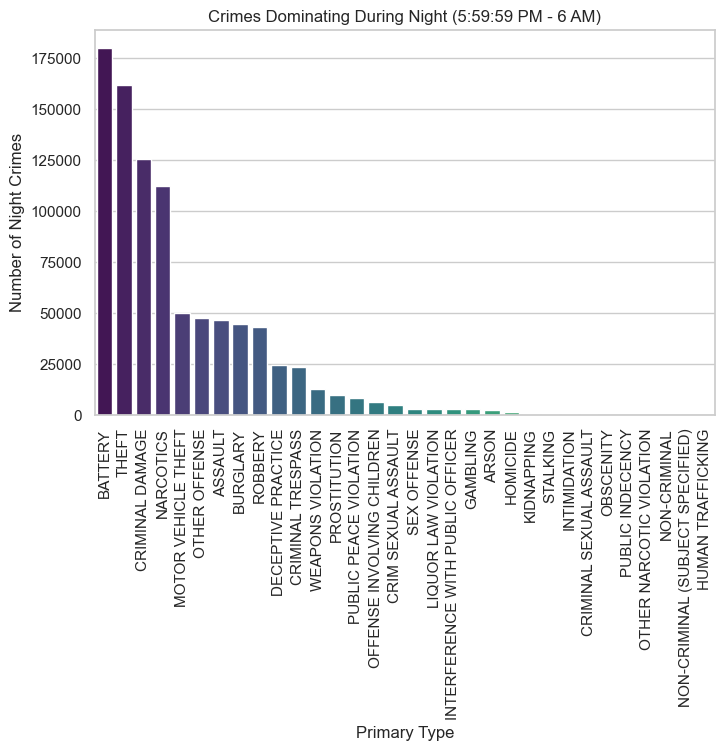

In [218]:
night_dominant_crimes_sorted = night_dominant_crimes_df.sort_values(by='Tot. crimes', ascending=False)

print('As you can see from the diagram below, there is a gruop of 4 "Primary Types" that reached over 100000 crimes committed during nighttime.')
print('A second group of 5 "Primary Types" has between 50000 and 25000 crimes committed during nighttime.')
print('The last group of "Primary Types" has less than 20000 crimes committed during night time\n')

plt.figure(figsize=(8, 5))
sns.barplot(
    data=night_dominant_crimes_sorted,
    x=night_dominant_crimes_sorted.index,
    y='Tot. crimes',
    palette='viridis'
)
plt.title('Crimes Dominating During Night (5:59:59 PM - 6 AM)')
plt.ylabel('Number of Night Crimes')
plt.xlabel('Primary Type')
plt.xticks(rotation=90)
plt.show()

**7.3** In general, for each weekday, how many crimes are recorded during daytime and how many during nighttime? What are the trends? Are there any weekdays that stands out somehow?

I creat a gridgraph that shows the crimes committed during nighttime and daytime for each weekday

By looking at the graphic below we can notice that daytime has a unstable trend of crimes committed compered to nighttime.
However, during Saturdays and Sundays the rate of crimes during daytime increase significantly, leaving nighttime as the period with less crimes committed.
It is extremely disappointing to notice that THIEVES and NARCOTICS OFFENDERS do not spend the weekend with thier loved ones, at least during the day by attending their holy places of worship.
It is not a great achimvment for the people of Chicago city! GOD BLESS AMERICA!


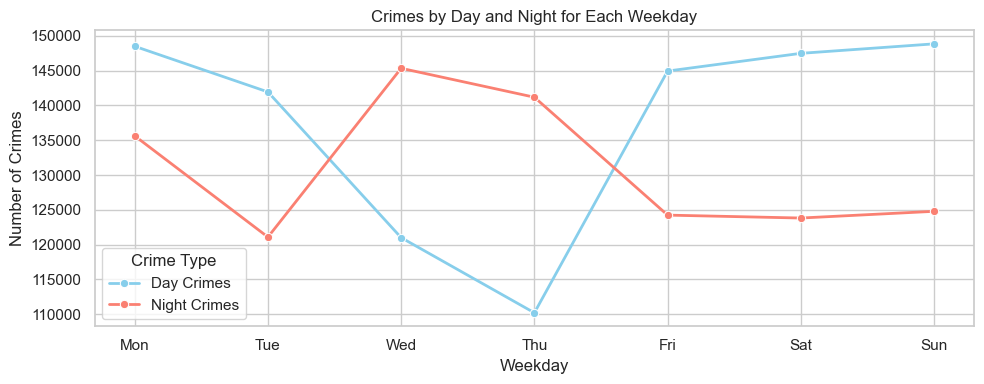

In [219]:
# Group by weekday and count crimes during the day and night
day_crime_counts_by_weekday = chicago_crime_2008_to_2012_df[day_time_mask].groupby('Weekday').size()
night_crime_counts_by_weekday = chicago_crime_2008_to_2012_df[night_time_mask].groupby('Weekday').size()

# Create a DataFrame for comparison
crime_time_comparison_weekday = pd.DataFrame({
    'Day Crimes': day_crime_counts_by_weekday,
    'Night Crimes': night_crime_counts_by_weekday}).fillna(0)

print('By looking at the graphic below we can notice that daytime has a unstable trend of crimes committed compered to nighttime.')
print('However, during Saturdays and Sundays the rate of crimes during daytime increase significantly, leaving nighttime as the period with less crimes committed.')
print('It is extremely disappointing to notice that THIEVES and NARCOTICS OFFENDERS do not spend the weekend with thier loved ones, at least during the day by attending their holy places of worship.')
print('It is not a great achimvment for the people of Chicago city! GOD BLESS AMERICA!')
plt.figure(figsize=(10,4))

sns.lineplot(x=crime_time_comparison_weekday.index, y=crime_time_comparison_weekday['Day Crimes'], marker='o', label='Day Crimes', color='skyblue', linewidth=2)
sns.lineplot(x=crime_time_comparison_weekday.index, y=crime_time_comparison_weekday['Night Crimes'], marker='o', label='Night Crimes', color='salmon', linewidth=2)

plt.title('Crimes by Day and Night for Each Weekday')
plt.xlabel('Weekday')
plt.ylabel('Number of Crimes')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.legend(title="Crime Type")
plt.tight_layout()
plt.show()




Monday, Tuesday, Wednesday, Thursday and Friday have overwhelmingly more recorded crimes during the day, than during the night.

Saturday also has more records during the day, but it's only slightly more than durnig the night.

Sunday is a trend breaker - wherein the number of recorded crimes are higher during the night, than during the night. Though not by alot.

**7.4** Does the trends you've found in 7.3 also hold if you look at each year individually?

i show through a data frame and then through a grid the trend of nighttime and daytime crimes through the years, 2008 until 2012

In [220]:
chicago_crime_2008_to_2012_df['Year'] = chicago_crime_2008_to_2012_df['Date'].dt.year

crime_trends_by_year = chicago_crime_2008_to_2012_df.groupby(['Year', night_time_mask]).size().unstack(fill_value=0)
crime_trends_by_year.columns = ['Day Crimes', 'Night Crimes']

crime_trends_by_year['Total Crimes'] = crime_trends_by_year.sum(axis=1)

crime_trends_by_year['Day %'] = round((crime_trends_by_year['Day Crimes'] / crime_trends_by_year['Total Crimes']) * 100,2)
crime_trends_by_year['Night %'] =round((crime_trends_by_year['Night Crimes'] / crime_trends_by_year['Total Crimes']) * 100,2)

crime_trends_by_year


,Day Crimes,Night Crimes,Total Crimes,Day %,Night %
Year,,,,,
2008,213536,213662,427198,49.99,50.01
2009,200019,192829,392848,50.92,49.08
2010,191166,179376,370542,51.59,48.41
2011,183200,168820,352020,52.04,47.96
2012,174969,161376,336345,52.02,47.98


The diagram below shows a costant decrase in crimes committed during daytime as nighttime too. It does not follow the trend found in 7.3


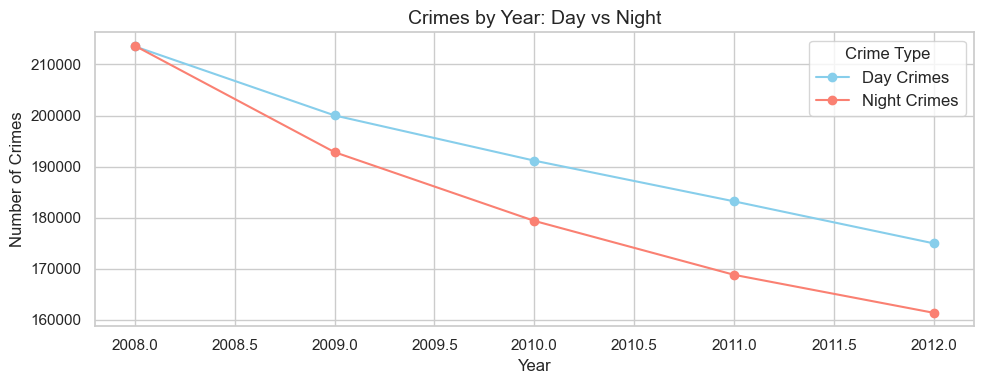

In [221]:
print('The diagram below shows a costant decrase in crimes committed during daytime as nighttime too. It does not follow the trend found in 7.3')
plt.figure(figsize=(10, 4))

plt.plot(crime_trends_by_year.index, crime_trends_by_year['Day Crimes'], label='Day Crimes', color='skyblue', marker='o')
plt.plot(crime_trends_by_year.index, crime_trends_by_year['Night Crimes'], label='Night Crimes', color='salmon', marker='o')
plt.title('Crimes by Year: Day vs Night', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Crimes', fontsize=12)
plt.legend(title="Crime Type", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


**7.5** Are there any weekdays in which Stalking occurs more often during nighttime?

I create a DataFrame to compare day and nighttime crimes, then i do a comparison between the two times of the day specifically for the primary types "STALKING" to check if there are weekdays were that occurs more during night. The result is a empty dataFrame, which means that there are not.

In [222]:
# Filter the dataset to include only crimes of type "STALKING"
stalking_crimes = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Primary Type'] == 'STALKING']

# Use the previously defined masks to count "STALKING" crimes during the day and night by wekday
day_stalking_counts_by_weekday = stalking_crimes[day_time_mask].groupby('Weekday').size()
night_stalking_counts_by_weekday = stalking_crimes[night_time_mask].groupby('Weekday').size()

# Create a DataFrame to compare day and night crime counts
stalking_comparison = pd.DataFrame({
    'Day Crimes': day_stalking_counts_by_weekday, 
    'Night Crimes': night_stalking_counts_by_weekday
}).fillna(0) 

stalking_night_dominance = stalking_comparison[stalking_comparison['Night Crimes'] > stalking_comparison['Day Crimes']]

print("Weekdays where 'STALKING' crimes are more common at night than during the day are 0 as the DataFrame below shows.")
stalking_night_dominance


Weekdays where 'STALKING' crimes are more common at night than during the day are 0 as the DataFrame below shows.


,Day Crimes,Night Crimes
Weekday,,


# 8 - Grand Theft Auto

**8.1** You just bought a new car. What weekday should you be most wary of as it has the highest risk for a Grand Theft Auto-style robbery (MOTOR VEHICLE THEFT)?

I simply answer the question by using a filter and 3 common methods

In [223]:
# Filter the dataset for "MOTOR VEHICLE THEFT"
vehicle_theft_crimes = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Primary Type'] == 'MOTOR VEHICLE THEFT']

# Group the filtered data by weekday and count occurrences
vehicle_theft_by_weekday = vehicle_theft_crimes.groupby('Weekday').size()

# Find the weekday with the highest count of vehicle thefts
riskiest_weekday = vehicle_theft_by_weekday.idxmax()
max_thefts = vehicle_theft_by_weekday.max()

print(f"The riskiest weekday for motor vehicle theft is {riskiest_weekday} with {max_thefts} reported cases.")


The riskiest weekday for motor vehicle theft is Friday with 13622 reported cases.


**8.2** For that day, where (at what location) should you absolutely avoid leave your car carelessly? Where is it seemingly safest to do so?

I isolate the most dangerous location on fridays just by using the same process of 8.1, then i sort values. 
I isolate the safest location, in this particular case the most 5 because they all show same values.

In [224]:
# Filter data for "MOTOR VEHICLE THEFT" on the riskiest weekday
riskiest_day_data = vehicle_theft_crimes[vehicle_theft_crimes['Weekday'] == riskiest_weekday]

# Group by location and count thefts
thefts_by_location = riskiest_day_data.groupby('Location Description').size()

# Find the location with the most thefts (most dangerous)
most_dangerous_location = thefts_by_location.idxmax()
max_thefts_at_location = thefts_by_location.max()

# Sort locations by theft count in ascending order
sorted_thefts_by_location = thefts_by_location.sort_values()

# Get the top 5 least risky locations (with > 0 thefts)
safest_locations = sorted_thefts_by_location[sorted_thefts_by_location > 0].head(5)

print(f"On {riskiest_weekday}, the most dangerous loction for motor vehicle theft is {most_dangerous_location} with {max_thefts_at_location} reported cases.\n")

print(f"On {riskiest_weekday}, these are the five safest locations for motor vehicle theft:\n")
print(safest_locations)


On Friday, the most dangerous loction for motor vehicle theft is STREET with 11095 reported cases.

On Friday, these are the five safest locations for motor vehicle theft:

Location Description
CONSTRUCTION SITE                 1
NURSING HOME/RETIREMENT HOME      1
FIRE STATION                      1
FACTORY/MANUFACTURING BUILDING    1
DAY CARE CENTER                   1
dtype: int64


**8.3*** Are there certain periods of the year/month/day/time of day where GTA is more frequent?

I created 4 subplots to represent the periods of the year where GTA is more frequent

Years 2008/ 2010/ 2011 show a high percentage of recorded crimes. 
February looks like a month that record less crimes compares to others.
The trend of vehicle theft during weekdays looks quit consistent.
The evenings, from 20 to 24 show a higher trend of recorded crimes.


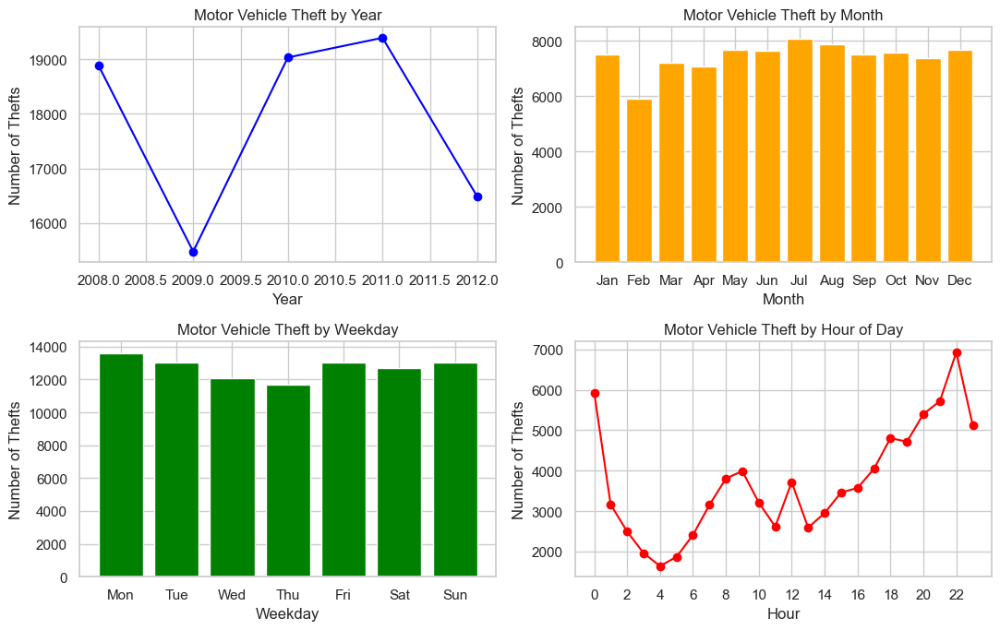

In [225]:
# Filter dataset for "MOTOR VEHICLE THEFT"
vehicle_theft_crimes = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Primary Type'] == 'MOTOR VEHICLE THEFT']

# Create new columns for analysis
vehicle_theft_crimes['Year'] = vehicle_theft_crimes['Date'].dt.year
vehicle_theft_crimes['Month'] = vehicle_theft_crimes['Date'].dt.month
vehicle_theft_crimes['Hour'] = vehicle_theft_crimes['Date'].dt.hour

# Count crimes by Year
thefts_by_year = vehicle_theft_crimes.groupby('Year').size()

# Count crimes by Month
thefts_by_month = vehicle_theft_crimes.groupby('Month').size()

# Count crimes by Weekday
thefts_by_weekday = vehicle_theft_crimes.groupby('Weekday').size()

# Count crimes by Hour of the day
thefts_by_hour = vehicle_theft_crimes.groupby('Hour').size()

print('Years 2008/ 2010/ 2011 show a high percentage of recorded crimes. \nFebruary looks like a month that record less crimes compares to others.\nThe trend of vehicle theft during weekdays looks quit consistent.\nThe evenings, from 20 to 24 show a higher trend of recorded crimes.')

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(11, 7))

# Crimes by Year
axes[0, 0].plot(thefts_by_year.index, thefts_by_year.values, marker='o', color='blue')
axes[0, 0].set_title("Motor Vehicle Theft by Year")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Number of Thefts")

# Crimes by Month
axes[0, 1].bar(thefts_by_month.index, thefts_by_month.values, color='orange')
axes[0, 1].set_title("Motor Vehicle Theft by Month")
axes[0, 1].set_xlabel("Month")
axes[0, 1].set_ylabel("Number of Thefts")
axes[0, 1].set_xticks(range(1, 13))
axes[0, 1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Crimes by Weekday
axes[1, 0].bar(thefts_by_weekday.index, thefts_by_weekday.values, color='green')
axes[1, 0].set_title("Motor Vehicle Theft by Weekday")
axes[1, 0].set_xlabel("Weekday")
axes[1, 0].set_ylabel("Number of Thefts")
axes[1, 0].set_xticks(range(7))
axes[1, 0].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])

# Crimes by Hour
axes[1, 1].plot(thefts_by_hour.index, thefts_by_hour.values, marker='o', color='red')
axes[1, 1].set_title("Motor Vehicle Theft by Hour of Day")
axes[1, 1].set_xlabel("Hour")
axes[1, 1].set_ylabel("Number of Thefts")
axes[1, 1].set_xticks(range(0, 24, 2))

plt.tight_layout()
plt.show()



# 9. Just send me like location

https://www.youtube.com/watch?v=k7yBJ5Ffkdo

**9.1** Are there any (geographical) areas hit particularly hard by prostitution on friday nights?

I created a filter for prostitution related crimes and a mask for friday nights(==4) and nighttime. Then i isolated the top 5 location where this specific crime occurs.

In [ ]:
# Filter the data for Prostitution-related crimes
prostitution_crimes = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Primary Type'] == 'PROSTITUTION']

# Create a mask for Friday nights (17:59:59 PM to 6 AM)
friday_night_mask = (prostitution_crimes['Date'].dt.weekday == 4) & \
                    ((prostitution_crimes['Date'].dt.hour > 18) | (prostitution_crimes['Date'].dt.hour <= 6))

# Filter the data for Friday night prostitution crimes
friday_night_prostitution = prostitution_crimes[friday_night_mask]

# Group by location and count the number of crimes
prostitution_by_location = friday_night_prostitution.groupby('Location Description').size()

# Sort locations by the number of prostitution crimes in descending order
sorted_prostitution_by_location = prostitution_by_location.sort_values(ascending=False)

# Get the top 5 locations with the most prostitution-related crimes
top_5_prostitution_locations = sorted_prostitution_by_location.head(5)

print("The top 5 locations affected by prostitution on Friday nights:")
top_5_prostitution_locations


The top 5 locations affected by prostitution on Friday nights:


Location Description
STREET         1752
HOTEL/MOTEL     100
SIDEWALK         92
ALLEY            20
OTHER            10
dtype: int64

**9.2** Can you vizualise the locations from 9.1 on a map of Chicago? Is there a concentration somewhere? 

With the help of LLM i/we created a scatterplot using plotly_express library. This graphic show the location where the prostition occurs the most.

In [227]:

valid_locations = friday_night_prostitution.dropna(subset=['Latitude', 'Longitude'])

# Create the scatter_mapbox plot
fig = px.scatter_mapbox(valid_locations,
                        lat='Latitude', 
                        lon='Longitude',
                        hover_name='Location Description',
                        hover_data={'Latitude': False, 'Longitude': False},
                        color='Location Description',  # You can adjust this if you want color by location
                        title='Prostitution-related Crimes on Friday Nights in Chicago',
                        template="plotly",
                        opacity=0.7)

# Update the map style and layout
fig.update_layout(mapbox_style="open-street-map",  # or you can use 'carto-positron', 'stamen-terrain', etc.
                  mapbox_zoom=12,
                  mapbox_center={"lat": 41.8781, "lon": -87.6298},  # Chicago's center
                  margin={"r":0,"t":40,"l":0,"b":0})  # Adjust margins for better display

fig.show()

print('Street appears as the most common place for prostitution. \nHotel/Motel appears to be almost as present as streets. \nResidental yard is also vry present on this map. ')

Street appears as the most common place for prostitution. 
Hotel/Motel appears to be almost as present as streets. 
Residental yard is also vry present on this map. 


**9.3*** Can you find any geographical concentration of other crime categories? Perhaps even by weekday and or day/nighttime? Plot these on a map of Chicago. 

On the map of chicago i plot the crimes concentration during Fridays night.

In [228]:
# Filter the data for specific crime categories, such as 'THEFT' and 'ASSAULT'
crime_categories = ['THEFT', 'ASSAULT', 'BATTERY']
crime_data = chicago_crime_2008_to_2012_df[chicago_crime_2008_to_2012_df['Primary Type'].isin(crime_categories)]

# Create a mask for daytime (6 AM - 6 PM) and nighttime (6 PM - 6 AM)
day_time_mask = (crime_data['Date'].dt.hour >= 6) & (crime_data['Date'].dt.hour <= 18)
night_time_mask = (crime_data['Date'].dt.hour > 18) | (crime_data['Date'].dt.hour < 6)

# Filter for day and night crimes
day_crimes = crime_data[day_time_mask]
night_crimes = crime_data[night_time_mask]

# For example, let's analyze the data on Friday nights (6 PM - 6 AM)
friday_night_mask = (crime_data['Date'].dt.weekday == 4) & \
                    ((crime_data['Date'].dt.hour >= 18) | (crime_data['Date'].dt.hour < 6))

friday_night_crimes = crime_data[friday_night_mask]

# Make sure to drop NaN values in latitude/longitude for plotting
valid_friday_night_crimes = friday_night_crimes.dropna(subset=['Latitude', 'Longitude'])

# Create the scatter_mapbox plot for Friday night crimes
fig = px.scatter_mapbox(valid_friday_night_crimes,
                        lat='Latitude',
                        lon='Longitude',
                        color='Primary Type',  # Color by the crime type
                        hover_name='Location Description',
                        hover_data={'Latitude': False, 'Longitude': False},
                        title='Geographical Distribution of Crimes on Friday Nights in Chicago',
                        template="plotly",
                        opacity=0.7)

# Update the map style and layout
fig.update_layout(mapbox_style="open-street-map",  # You can change to 'carto-positron', 'stamen-terrain', etc.
                  mapbox_zoom=12,
                  mapbox_center={"lat": 41.8781, "lon": -87.6298},  # Chicago's center
                  margin={"r":0,"t":40,"l":0,"b":0})

fig.show()


# 10 - The $ factor

I decided to merge our 2 DataFrame (chicago and census crime) on 'Block'.
With the use of LLM i merge i created the code

**10.1** Merge the crime and census datasets together in a suitable way.

In [229]:

crime_data = pd.DataFrame({
    'Crime ID': [1, 2],  # Crime identification
    'Primary Type': ['Theft', 'Assault'],  # Type of crime
    'Date': ['2008-01-01', '2008-01-02'],  # Date of the crime
    'Block': ['1000 N', '5000 S'],  # Block identifier where the crime occurred
    'Latitude': [41.8781, 41.8892],  # Latitude of the crime location
    'Longitude': [-87.6298, -87.6312],  # Longitude of the crime location
})

# Example census data (simulated)
census_data = pd.DataFrame({
    'Community Area Number': [1, 2],  # Community area number
    'Block': ['1000 N', '5000 S'],  # Block identifier matching the crime data
    'Census Data': ['Data1', 'Data2'],  # Census-related data (e.g., demographics)
})

# Perform the merge on the 'Block' column
# The merge will combine crime data with census data based on the 'Block' identifier
merged_data = pd.merge(crime_data, census_data, on='Block', how='left')

merged_data


,Crime ID,Primary Type,Date,Block,Latitude,Longitude,Community Area Number,Census Data
0,1,Theft,2008-01-01,1000 N,41.8781,-87.6298,1,Data1
1,2,Assault,2008-01-02,5000 S,41.8892,-87.6312,2,Data2


**10.2*** Are there certain kinds of socoeconomic area that are more prone to certain kinds of crimes? Do a deep dive in the direction you fancy yourself here.

I tried to merge on 'Block' again. The result is this code, made with the help of LLM.

In [230]:

crime_data = pd.DataFrame({
    'Crime ID': [1, 2, 3, 4, 5],
    'Primary Type': ['Theft', 'Assault', 'Theft', 'Burglary', 'Assault'],
    'Date': ['2008-01-01', '2008-01-02', '2008-01-03', '2008-01-04', '2008-01-05'],
    'Block': ['1000 N', '5000 S', '1000 N', '1000 N', '5000 S'],
    'Latitude': [41.8781, 41.8892, 41.8781, 41.8781, 41.8892],
    'Longitude': [-87.6298, -87.6312, -87.6298, -87.6298, -87.6312],
})

census_data = pd.DataFrame({
    'Community Area Number': [1, 2],
    'Block': ['1000 N', '5000 S'],
    'PERCENT HOUSEHOLDS BELOW POVERTY': [25, 40],
    'PERCENT AGED 16+ UNEMPLOYED': [10, 20],
    'PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA': [15, 30],
    'PERCENT AGED UNDER 18 OR OVER 64': [35, 45],
    'Per Capita Income': [15000, 12000],
    'HARDSHIP INDEX': [50, 75]
})

# Merging crime and census data on the 'Block' column
merged_data = pd.merge(crime_data, census_data, on='Block', how='left')

merged_data


,Crime ID,Primary Type,Date,Block,Latitude,Longitude,Community Area Number,PERCENT HOUSEHOLDS BELOW POVERTY,PERCENT AGED 16+ UNEMPLOYED,PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA,PERCENT AGED UNDER 18 OR OVER 64,Per Capita Income,HARDSHIP INDEX
0,1,Theft,2008-01-01,1000 N,41.8781,-87.6298,1,25,10,15,35,15000,50
1,2,Assault,2008-01-02,5000 S,41.8892,-87.6312,2,40,20,30,45,12000,75
2,3,Theft,2008-01-03,1000 N,41.8781,-87.6298,1,25,10,15,35,15000,50
3,4,Burglary,2008-01-04,1000 N,41.8781,-87.6298,1,25,10,15,35,15000,50
4,5,Assault,2008-01-05,5000 S,41.8892,-87.6312,2,40,20,30,45,12000,75


# 11 - Your turn!

There are obviously so much more to gain by analysing these datasets. This is now your opportunity to dwelve deeper into what you yourself like.

    Instructions: think of one or several questions (as we've done above). Then, proceed with your own deep dive analysis and provide your answers.